# Initialisations

In [2]:
import scanpy as sc
import seaborn as sns
import pandas as pd
import anndata
import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import median_abs_deviation

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

import anndata2ri
import logging
import matplotlib.pyplot as plt

import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

/var/folders/gv/57z5thfs7kqfq2njhk1gg9jc0000gn/T/ipykernel_4497/3927587813.py:25: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [ ]:
adata = sc.read_h5ad("adata_source.h5ad")
adata.var_names = adata.var['gene_symbols']
adata


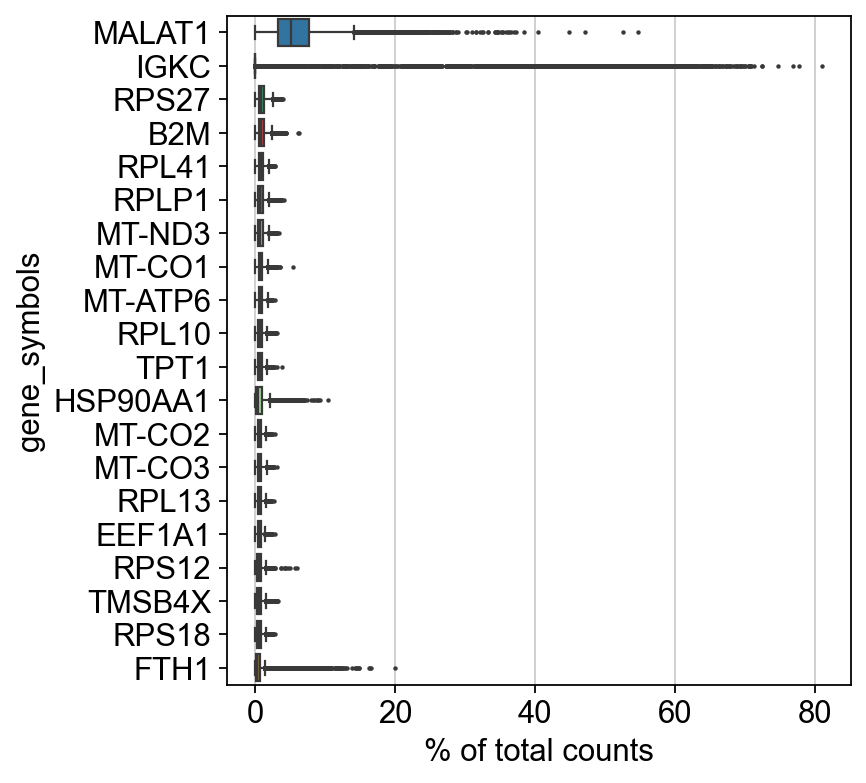

In [4]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [5]:
#think downloaded data had already done this, but removing just in case
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_cells(adata, max_genes=3500)

#sc.pp.filter_genes(adata, min_cells=3)

adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes'
    var: 'gene_symbols'

In [6]:
adata.obs

,cell_ids,n_genes
0,AAACCCAAGGAGACCT.1_1,991
1,AAACCCAGTAGACAGC.1_1,1063
2,AAACCCAGTAGATCGG.1_1,855
3,AAACCCAGTATCACCA.1_1,1004
4,AAACCCAGTTGGAGGT.1_1,959
...,...,...
52382,TTTGGTTCATTGAAGA.1_10,1255
52383,TTTGGTTGTTGTCCCT.1_10,3209
52384,TTTGGTTGTTTGACAC.1_10,1517
52385,TTTGTTGAGGGTCAAC.1_10,779


# Pre-Normalisation QC


In [7]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

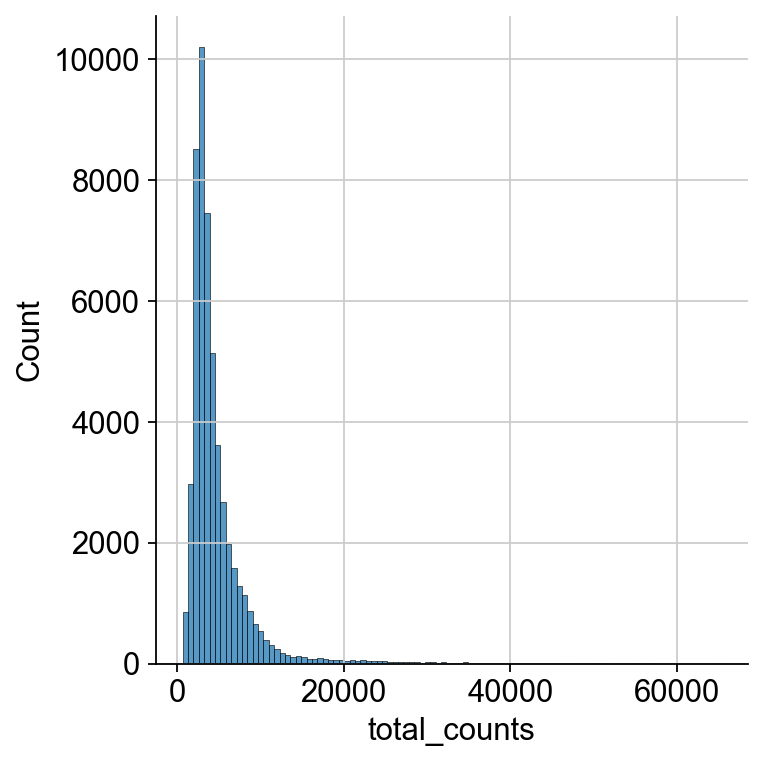

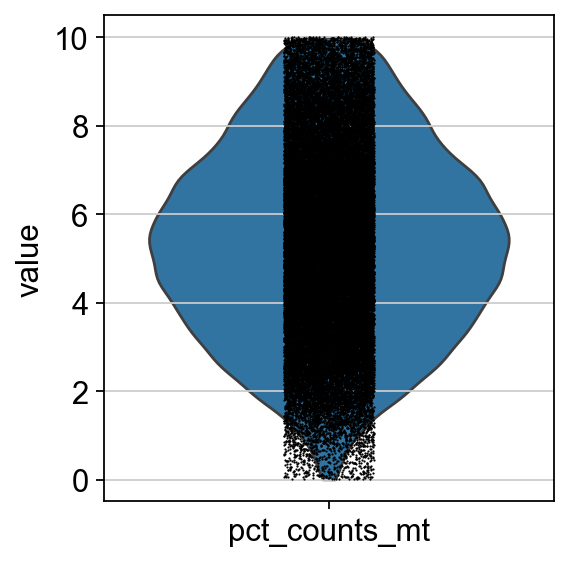

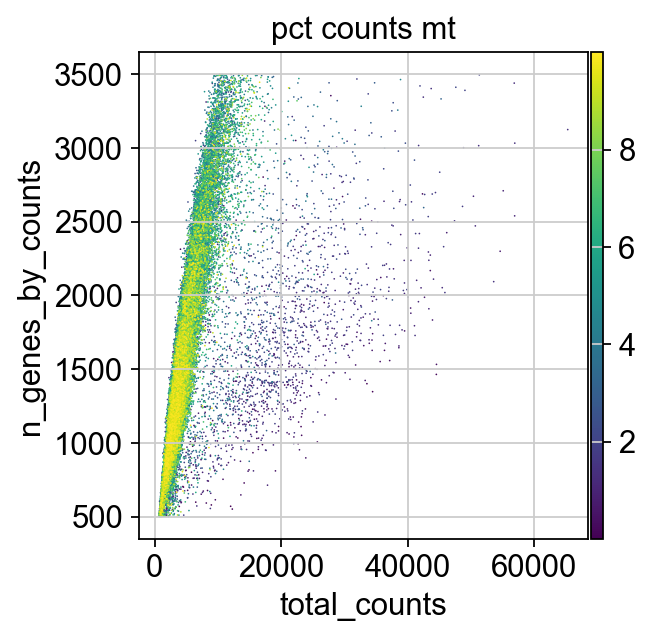

In [8]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

####looks lile pre=processing based on % mt counts has also been done

# Normalisation

# Shifted log

Good for uncovering latent dataset structure (espeically w/ PCA), stabilising variance for subsequent identification of highly variable genes

In [9]:
scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

In [10]:
adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'log1p_norm'

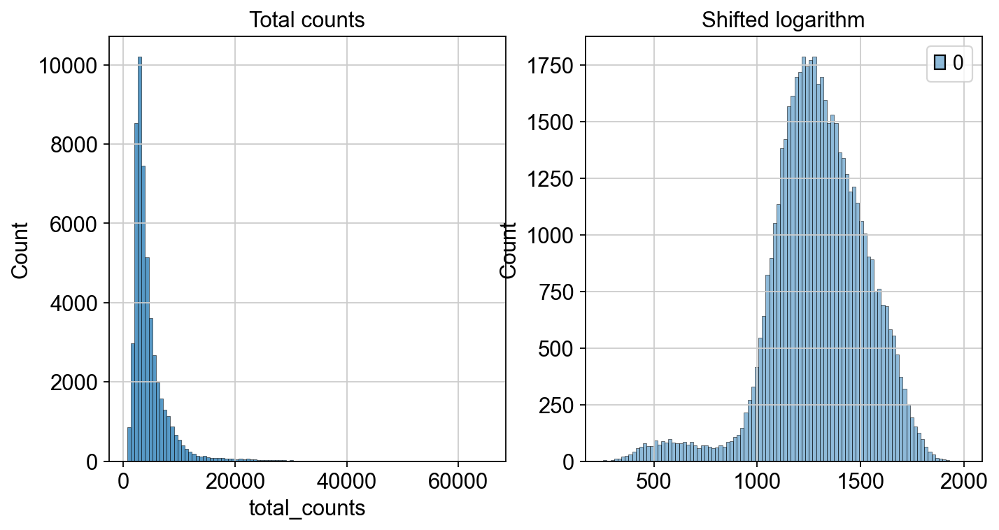

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs['total_counts'], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(adata.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

# SCRAN - shifted Log

better accounts for differences in count depth across cells -> good for batch correction

In [12]:
from scipy.sparse import csr_matrix, issparse

In [13]:
%%R
library(scran)
library(BiocParallel)

Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: ‘MatrixGenerics’

The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOr

In [14]:
# Preliminary clustering for differentiated normalisation
adata_pp = adata.copy()
sc.pp.normalize_total(adata_pp)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="groups")

/var/folders/gv/57z5thfs7kqfq2njhk1gg9jc0000gn/T/ipykernel_46861/2214793430.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_pp, key_added="groups")


In [15]:
data_mat = adata_pp.X.T
# convert to CSC if possible. See https://github.com/MarioniLab/scran/issues/70
if issparse(data_mat):
    if data_mat.nnz > 2**31 - 1:
        data_mat = data_mat.tocoo()
    else:
        data_mat = data_mat.tocsc()
ro.globalenv["data_mat"] = data_mat
ro.globalenv["input_groups"] = adata_pp.obs["groups"]

In [16]:
del adata_pp

In [ ]:
%%R -o size_factors

size_factors = sizeFactors(
    computeSumFactors(
        SingleCellExperiment(
            list(counts=data_mat)), 
            clusters = input_groups,
            min.mean = 0.1,
            BPPARAM = MulticoreParam()
    )
)

In [20]:
adata.obs["size_factors"] = size_factors
scran = adata.X / adata.obs["size_factors"].values[:, None]
adata.layers["scran_normalization"] = csr_matrix(sc.pp.log1p(scran))

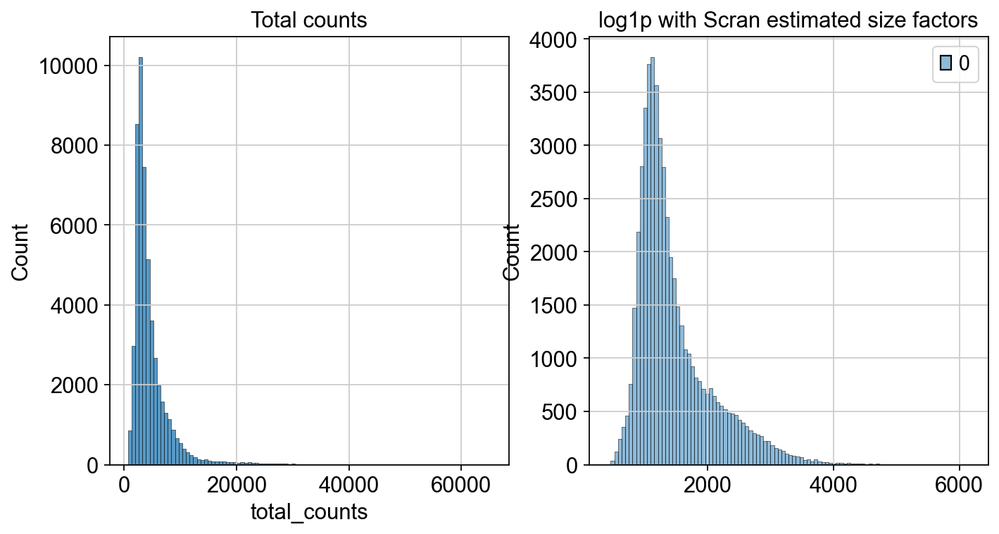

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(
    adata.layers["scran_normalization"].sum(1), bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("log1p with Scran estimated size factors")
plt.show()

In [22]:
adata.write("post_normalisation.h5ad")

In [23]:
adata.X.max()

36319.0107997546

# Analytical Pearson residuals

In [24]:
import scanpy as sc
import numpy as np

In [25]:
np.max(adata.X)

36319.0107997546

In [23]:
#analytic_pearson = sc.experimental.pp.normalize_pearson_residuals(adata, inplace=False)

In [24]:
#adata.layers["analytic_pearson_residuals"] = csr_matrix(analytic_pearson["X"])

In [ ]:
'''
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(
    adata.layers["analytic_pearson_residuals"].sum(1), bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("Analytic Pearson residuals")
plt.show()
'''

In [26]:
#sc.pp.normalize_total(adata, target_sum=1e4)
#sc.pp.log1p(adata)

# Feature selection
- think all other pre-processing steps had been done, couldn't find any evidence of data stored relating to the 'batch' it came from, which was last step of pre-processing paper listed
- using deviance rather than the highly variable the paper used - recommendation of best practices tutorial, because log-transformations may introduce bias when adding a pseuo-count, deviance works of raw counts

In [26]:
adata = sc.read_h5ad("post_normalisation.h5ad")
adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'log1p_norm', 'scran_normalization'

In [27]:
%%R -i adata
library(scry)

In [28]:
ro.globalenv["adata"] = adata

In [30]:
%%R
sce = devianceFeatureSelection(adata, assay="X")

In [31]:
binomial_deviance = ro.r("rowData(sce)$binomial_deviance").T

In [32]:
idx = binomial_deviance.argsort()[-8000:]
mask = np.zeros(adata.var_names.shape, dtype=bool)
mask[idx] = True

adata.var["highly_deviant"] = mask
adata.var["binomial_deviance"] = binomial_deviance

adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance'
    layers: 'log1p_norm', 'scran_normalization'

In [33]:
sc.pp.highly_variable_genes(adata, layer="log1p_norm")
adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg'
    layers: 'log1p_norm', 'scran_normalization'

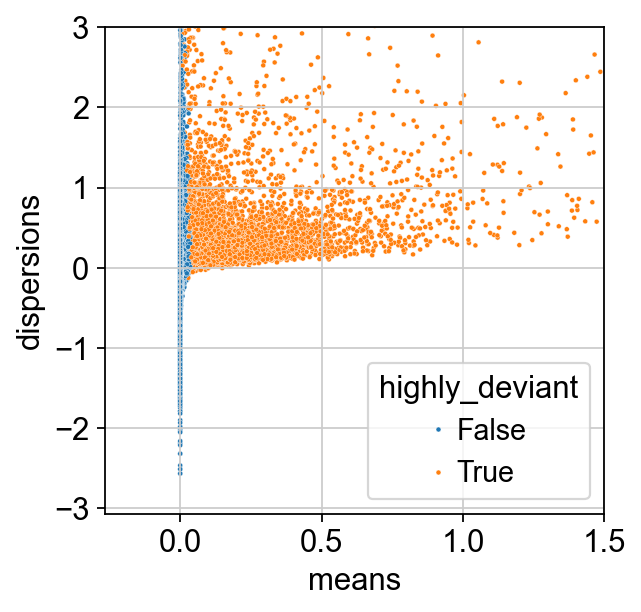

In [34]:
ax = sns.scatterplot(
    data=adata.var, x="means", y="dispersions", hue="highly_deviant", s=5
)
ax.set_xlim(None, 1.5)
ax.set_ylim(None, 3)
plt.show()

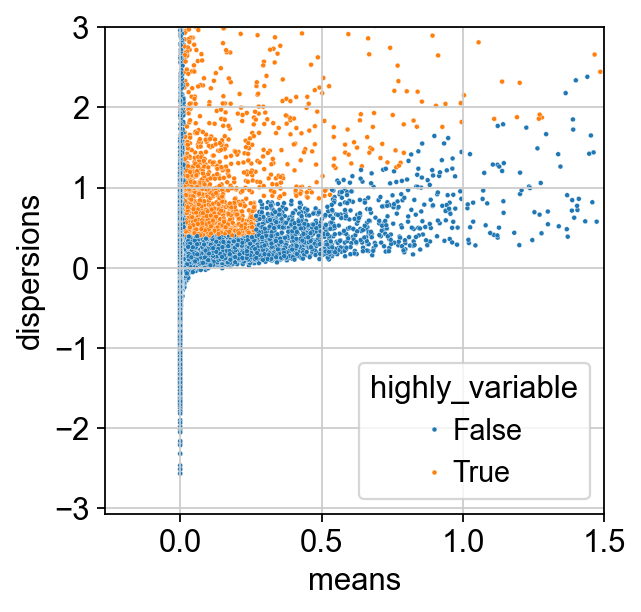

In [36]:
ax = sns.scatterplot(
    data=adata.var, x="means", y="dispersions", hue="highly_variable", s=5
)
ax.set_xlim(None, 1.5)
ax.set_ylim(None, 3)
plt.show()

In [39]:
adata
adata.write("post_feature_selection.h5ad")

# DIM reductin - ASK ABOUT SOME OF PRE-PROCESSING STEPS

In [40]:
import scanpy as sc

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

In [ ]:
adata = sc.read_h5ad("post_feature_selection.h5ad")
adata

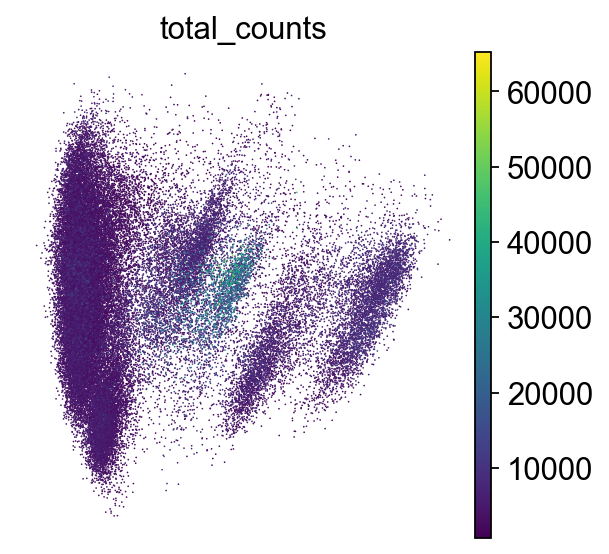

In [48]:
## Choose normalisation


sc.pp.pca(adata, layer = "log1p_norm", svd_solver="arpack", mask_var = "highly_deviant")
#sc.pp.pca(adata, layer = "scran_normalization", svd_solver="arpack", mask_var = "highly_deviant")

sc.pl.pca_scatter(adata, color="total_counts")

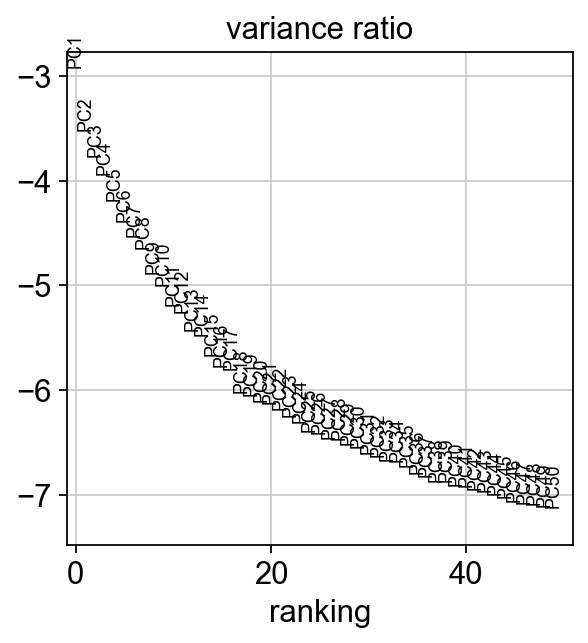

In [42]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

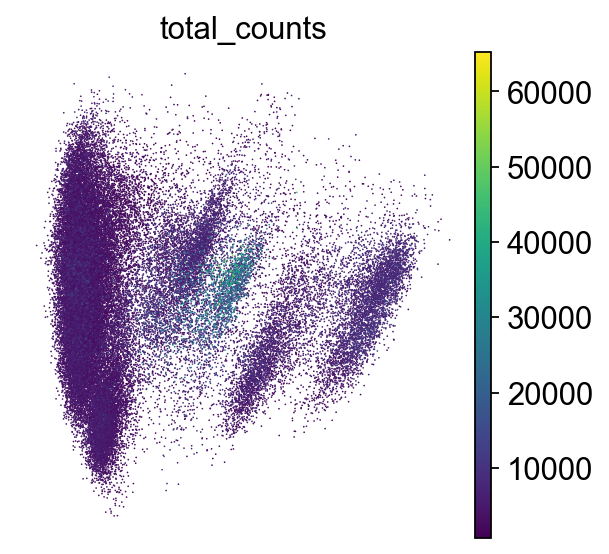

In [43]:
sc.pl.pca_scatter(adata, color="total_counts")

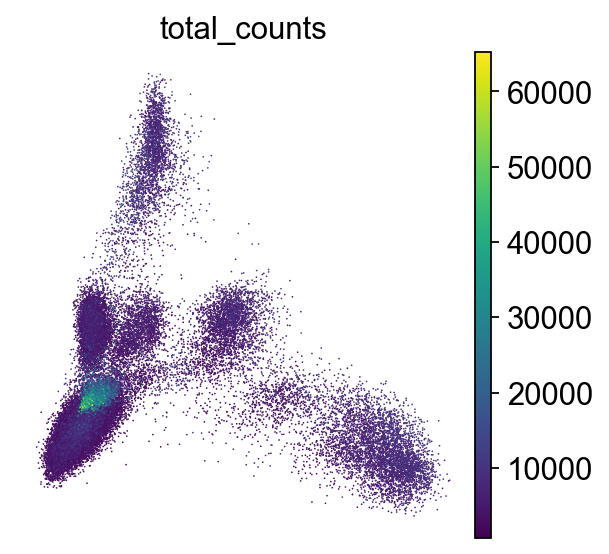

In [ ]:
### Commented as better to use highly deviant
#### determines whether highly_variable or highly_deviant is used

sc.pp.pca(adata, layer = "log1p_norm", svd_solver="arpack", mask_var = "highly_variable")
sc.pl.pca_scatter(adata, color="total_counts")

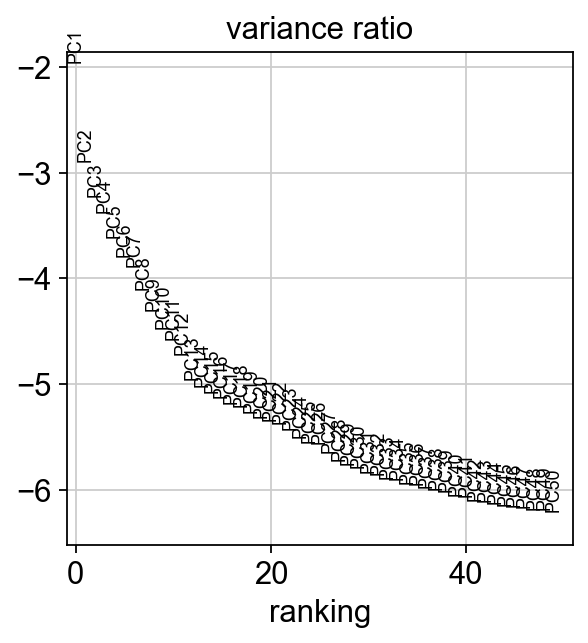

In [52]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

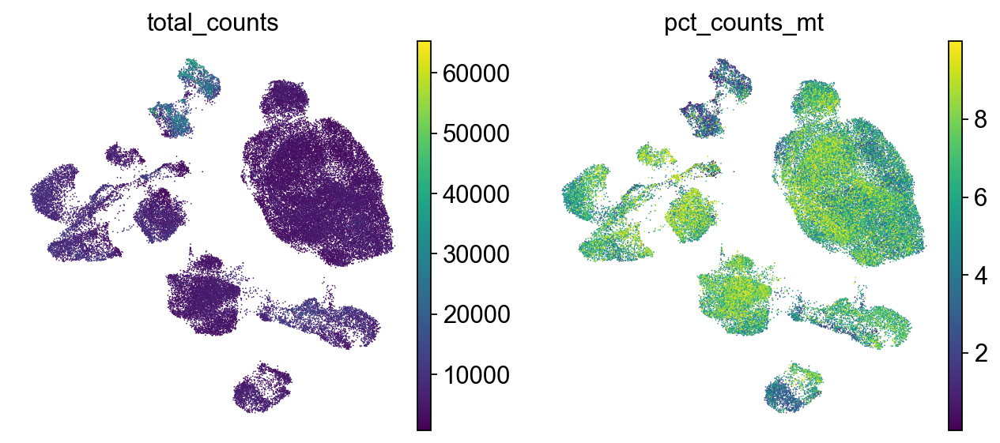

In [53]:
sc.pp.neighbors(adata, n_pcs=20)
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt"],
)

In [ ]:
adata

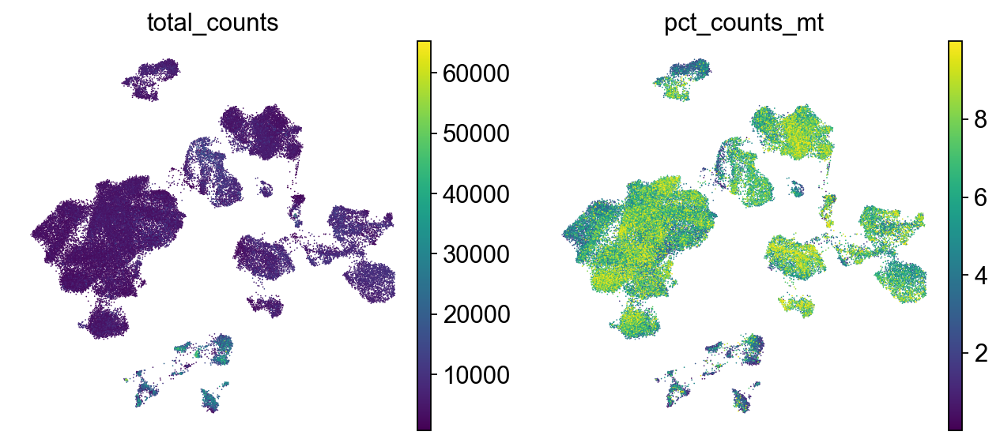

In [51]:
### 50 PC's - probs too high, paper uses 20 (above)

sc.pp.neighbors(adata, n_pcs=50)
sc.tl.umap(adata)

sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt"],
)

In [56]:
adata.write("post_dim_reduction.h5ad")

# Clustering

In [57]:
import scanpy as sc

sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=80, facecolor="white", frameon=False)

In [58]:
adata = sc.read("post_dim_reduction.h5ad")
adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'log1p_norm', 'scran_normalization'
    obsp: 'connectivities', 'distances'

In [59]:
#### num of clustering PCs used

sc.pp.neighbors(adata, n_pcs=20)
sc.tl.umap(adata)

In [60]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_4", resolution=0.4)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res0_6", resolution=0.6)
sc.tl.leiden(adata, key_added="leiden_res0_7", resolution=0.7)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

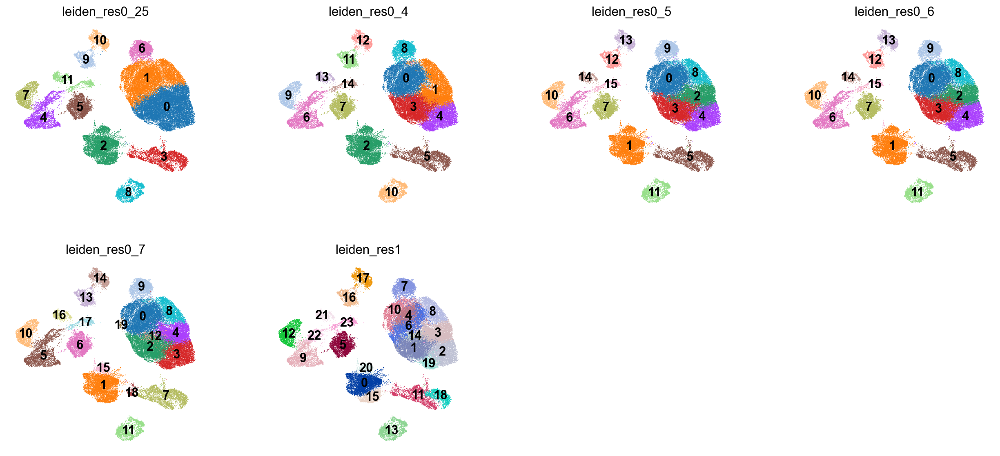

In [63]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_4", "leiden_res0_5", "leiden_res0_6", "leiden_res0_7","leiden_res1"],
    legend_loc="on data",
    
)

In [65]:
adata.write("post_clustering.h5ad")

# Annotation 

In [10]:
adata = sc.read_h5ad("post_clustering.h5ad")
adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors', 'leiden_res0_25', 'leiden_res0_4', 'leiden_res0_5', 'leiden_res0_6', 'leiden_res0_7', 'leiden_res1'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_4', 'leiden_res0_4_colors', 'leiden_res0_5', 'leiden_res0_5_colors', 'leiden_res0_6', 'leiden_res0_6_colors', 'leiden_res0_7', 'leiden_res0_7_colors', 'leiden

In [11]:
#import scarches as sca
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist ## don't use in final
from celltypist import models

import urllib.request

In [12]:
# Marker genes taken from figure 1 of data paper

marker_genes = {
    "T-cell": ["CD3D", "IL7R", "CD2", "TRBC2", "TRBC1", "IL32"],
    "NK" : ["GNLY", "NKG7", "GZMB", "KLRD1", "PRF1", "GZMA"],
    "B-cell": ["MS4A1", "HLA-DRA", "BANK1", "CD79A", "CD83", "HLA-DQB1"],
    "Fibroblast": ["DCN", "CFD", "FBLN1", "LUM", "COL3A1", "COL1A2"],
    "Endothelial": ["PECAM1", "ACKR1", "TM4SF1", "AQP1", "IFI27", "EMP1", "CLDN5"],
    "Plasmablast": ["IGKC", "IGLC3", "IGLC2", "IGHA1", "IGHG4", "IGHG3"],
    "Myeloid": ["LYZ", "S100A9", "CXCL8", "IL1B", "S100A8", "EREG"],
    "Mast": ["TPSAB1", "TPSB2", "CPA3", "LTC4S", "MS4A2", "HDC"],
    "Myofibroblast": ["RGS5", "TAGLN", "MT1A", "MT1M", "C11orf96"],
    "Epithelial": ["EPCAM", "ELF3", "AGR2", "KRT19", "CLDN4", "KRT8", "KRT18"],
    "Cycling": ["MKI67", "STMN1", "TYMS", "TOP2A", "PCLAF", "CENPF", "ITGAE", "ENTPD1"],
}

In [13]:
### Makes sure genes abbove are only included if present in our dataset
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [14]:
adata.layers

Layers with keys: log1p_norm, scran_normalization

In [15]:
adata.layers["counts"] = adata.X

#### ---- THESE CELL WERE NOT AFFECTING ANNOTATION - CHANGE ABOVE INSTEAD ----

In [9]:
#### Annotation based on chosen normalisation
adata.X = adata.layers["scran_normalization"]
#adata.X = adata.layers["log1p_norm"]

In [73]:
### Using highly deviant rather than variable for reasons mentioned above
adata.var["highly_variable"] = adata.var["highly_deviant"]

In [74]:
### Using 20 PC's as in original paper - should try varying this
#this function calculates PC's using sckit learn implementation 
sc.tl.pca(adata, n_comps=20, use_highly_variable=True)

In [75]:
#calculates NN distance matrix and graph using PC's specified above
sc.pp.neighbors(adata, n_pcs=20)

### --------

In [16]:
# Recreating high level clusters from data paper:
lymph_T = [
    "T-cell",
    "NK"
]

lymph_B = [
    "B-cell",
    "Plasmablast"
]

stromal = [
    "Epithelial",
    "Endothelial",
    "Myofibroblast",
    "Fibroblast",
]

myeloid = [
    "Myeloid"
]

mast = [
    "Mast"
]

cycling = [
    "Cycling"
]

In [17]:
list(marker_genes.keys())

['T-cell',
 'NK',
 'B-cell',
 'Fibroblast',
 'Endothelial',
 'Plasmablast',
 'Myeloid',
 'Mast',
 'Myofibroblast',
 'Epithelial',
 'Cycling']

B-CELL:


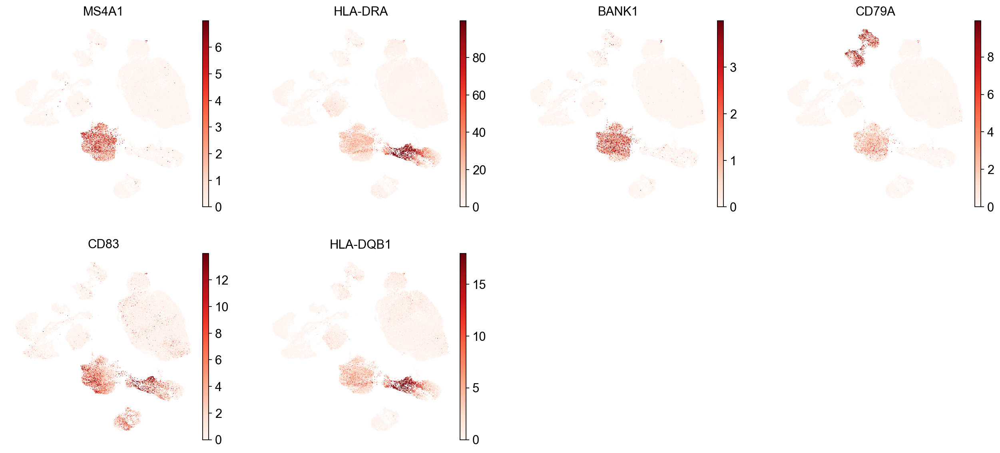





PLASMABLAST:


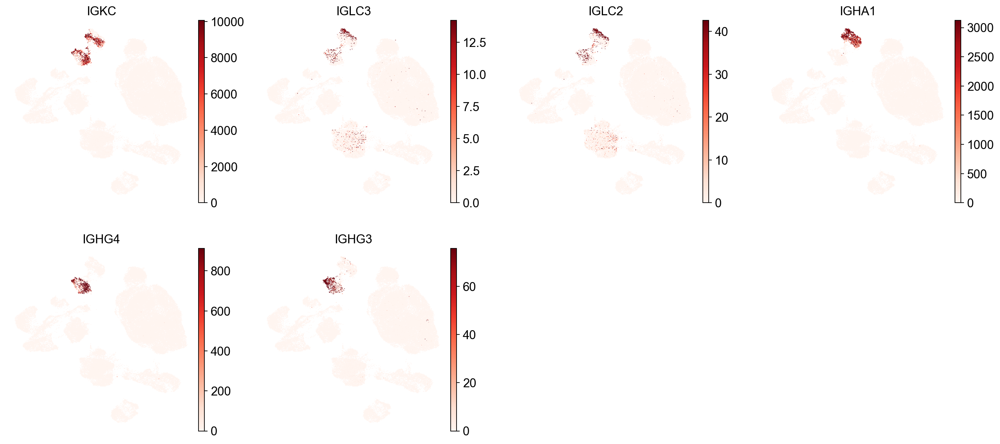

In [18]:
#visualise markers on UMAP for each high-level cluster - just change name

for ct in lymph_B:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility


In [19]:
adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors', 'leiden_res0_25', 'leiden_res0_4', 'leiden_res0_5', 'leiden_res0_6', 'leiden_res0_7', 'leiden_res1'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_4', 'leiden_res0_4_colors', 'leiden_res0_5', 'leiden_res0_5_colors', 'leiden_res0_6', 'leiden_res0_6_colors', 'leiden_res0_7', 'leiden_res0_7_colors', 'leiden

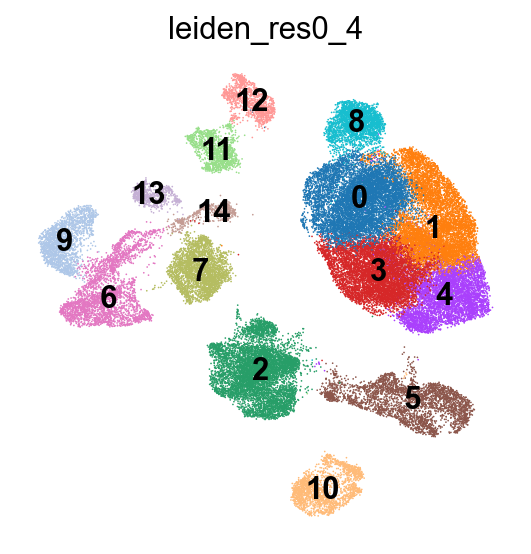

In [20]:
sc.pl.umap(adata, color="leiden_res0_4", legend_loc="on data")

In [21]:
# Create cell type groups for dot plots below - from marker_genes defined above
Cell_types = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in list(marker_genes.keys())
}

In [22]:
Cell_types

{'T-cell': ['CD3D', 'IL7R', 'CD2', 'TRBC2', 'TRBC1', 'IL32'],
 'NK': ['GNLY', 'NKG7', 'GZMB', 'KLRD1', 'PRF1', 'GZMA'],
 'B-cell': ['MS4A1', 'HLA-DRA', 'BANK1', 'CD79A', 'CD83', 'HLA-DQB1'],
 'Fibroblast': ['DCN', 'CFD', 'FBLN1', 'LUM', 'COL3A1', 'COL1A2'],
 'Endothelial': ['PECAM1',
  'ACKR1',
  'TM4SF1',
  'AQP1',
  'IFI27',
  'EMP1',
  'CLDN5'],
 'Plasmablast': ['IGKC', 'IGLC3', 'IGLC2', 'IGHA1', 'IGHG4', 'IGHG3'],
 'Myeloid': ['LYZ', 'S100A9', 'CXCL8', 'IL1B', 'S100A8', 'EREG'],
 'Mast': ['TPSAB1', 'TPSB2', 'CPA3', 'LTC4S', 'MS4A2', 'HDC'],
 'Myofibroblast': ['RGS5', 'TAGLN', 'MT1A', 'MT1M', 'C11orf96'],
 'Epithelial': ['EPCAM', 'ELF3', 'AGR2', 'KRT19', 'CLDN4', 'KRT8', 'KRT18'],
 'Cycling': ['MKI67',
  'STMN1',
  'TYMS',
  'TOP2A',
  'PCLAF',
  'CENPF',
  'ITGAE',
  'ENTPD1']}

In [23]:
adata.uns.keys()

dict_keys(['hvg', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_4', 'leiden_res0_4_colors', 'leiden_res0_5', 'leiden_res0_5_colors', 'leiden_res0_6', 'leiden_res0_6_colors', 'leiden_res0_7', 'leiden_res0_7_colors', 'leiden_res1', 'leiden_res1_colors', 'neighbors', 'pca', 'umap'])

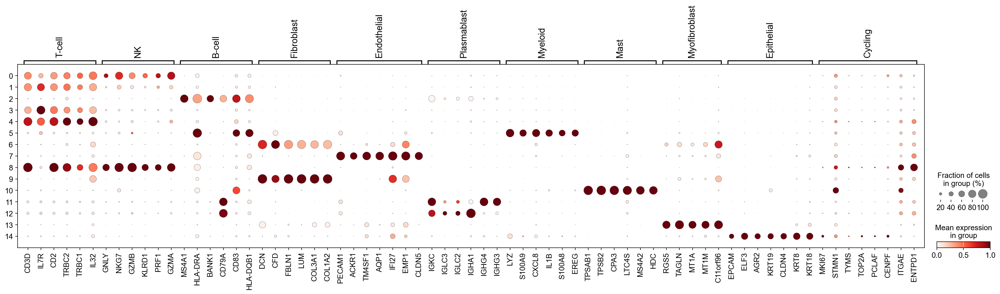

In [24]:
### Can vary my clustering resolution from here
sc.pl.dotplot(
    adata,
    groupby="leiden_res0_4",
    var_names=Cell_types,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [25]:
### Leiden 0.4 resolution annotations
cl_annotation = {
    "0": "T/NK",
    "1": "T-Cell",
    "2": "B-Cell",
    "3": "T-Cell", 
    "4": "T-Cell", 
    "5": "Myeloid", 
    "6": "Fibroblast", 
    "7": "Endothelial", 
    "8": "T/NK", 
    "9": "Fibroblast", 
    "10": "Mast",
    "11": "Plasmablast",
    "12": "Plasmablast",
    "13": "Myofibroblast",
    "14": "Epithelial",
}

In [80]:
### Leiden 0.5 resolution annotations
cl_annotation = {
    "0": "T/NK",
    "1": "B-Cell",
    "2": "T-Cell",
    "3": "T-Cell", 
    "4": "T-Cell", 
    "5": "Myeloid", 
    "6": "Fibroblast", 
    "7": "Endothelial", 
    "8": "T/NK", 
    "9": "T/NK", 
    "10": "Fibroblast",
    "11": "Mast",
    "12": "Plasmablast",
    "13": "Plasmablast",
    "14": "Myofibroblast",
    "15": "Epithelial",
    "16": "Myofibroblast",
    "17": "Epithelial",
    "18": "Cycling",
    "19": "NK"
}

In [81]:
### Leiden 0.7 resolution annotations
cl_annotation = {
    "0": "T/NK",
    "1": "B-Cell",
    "2": "T",
    "3": "T-Cell", 
    "4": "T-Cell", 
    "5": "Fibroblast", 
    "6": "Endothelial", 
    "7": "Myeloid", 
    "8": "T/NK", 
    "9": "T/NK", 
    "10": "Fibroblast",
    "11": "Mast",
    "12": "T-Cell",
    "13": "Plasmablast",
    "14": "Plasmablast",
    "15": "B-Cell",
    "16": "Myofibroblast",
    "17": "Epithelial",
    "18": "Cycling",
    "19": "NK"
}

In [ ]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_res0_4.map(cl_annotation)

In [1]:
adata.obs["manual_celltype_annotation"] 

NameError: name 'adata' is not defined

... storing 'manual_celltype_annotation' as categorical


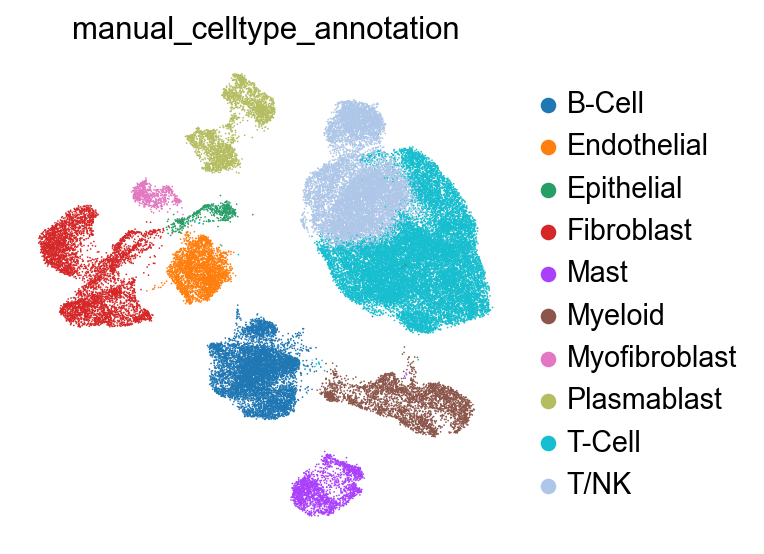

In [27]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

# Cluster-Specific DEG's as markers

### In data paper - seem to have clustered until a higher resolution would mean there were < 5 DEG's per cluster

In [28]:
adata.uns.keys()

dict_keys(['hvg', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_4', 'leiden_res0_4_colors', 'leiden_res0_5', 'leiden_res0_5_colors', 'leiden_res0_6', 'leiden_res0_6_colors', 'leiden_res0_7', 'leiden_res0_7_colors', 'leiden_res1', 'leiden_res1_colors', 'neighbors', 'pca', 'umap', 'manual_celltype_annotation_colors'])

In [29]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res0_4", method="wilcoxon")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


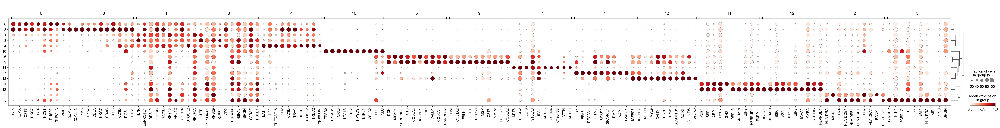

In [30]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res0_4", standard_scale="var"
)

In [58]:
adata

AnnData object with n_obs × n_vars = 52387 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors', 'leiden_res0_25', 'leiden_res0_4', 'leiden_res0_5', 'leiden_res0_6', 'leiden_res0_7', 'leiden_res1', 'manual_celltype_annotation', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_4', 

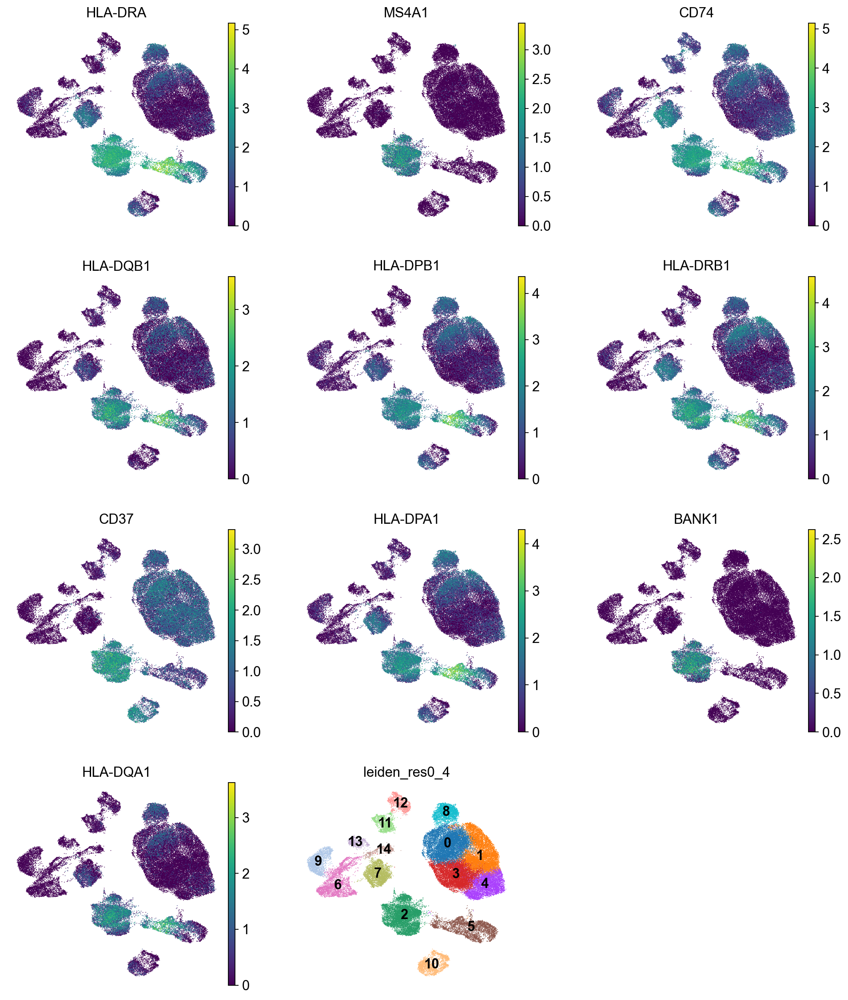

In [59]:
adata.X = adata.layers['log1p_norm']

dc_cluster_genes = sc.get.rank_genes_groups_df(adata, group="2").head(10)["names"]
sc.pl.umap(
    adata,
    color=[*dc_cluster_genes, "leiden_res0_4"],
    legend_loc="on data",
    frameon=False,
    ncols=3,
)

In [34]:
sc.get.rank_genes_groups_df(adata, group = "2").head(10)

,names,scores,logfoldchanges,pvals,pvals_adj
0,HLA-DRA,116.001038,18.236336,0.0,0.0
1,MS4A1,109.560722,9.841911,0.0,0.0
2,CD74,100.978775,10.941446,0.0,0.0
3,HLA-DQB1,100.688568,4.492072,0.0,0.0
4,HLA-DPB1,98.228874,4.292268,0.0,0.0
5,HLA-DRB1,97.428146,6.254945,0.0,0.0
6,CD37,94.319626,4.526005,0.0,0.0
7,HLA-DPA1,92.458878,3.738521,0.0,0.0
8,BANK1,90.789673,8.157041,0.0,0.0
9,HLA-DQA1,90.009560,4.029520,0.0,0.0


In [91]:
adata.obs['manual_celltype_annotation'].value_counts()

T-Cell           18734
T/NK             10448
B-Cell            6831
Fibroblast        4919
Myeloid           3117
Endothelial       2857
Plasmablast       2452
Mast              1915
Myofibroblast      625
Epithelial         489
Name: manual_celltype_annotation, dtype: int64

# Automated annotation

## Cell Typist

In [35]:
import celltypist
from celltypist import models

In [36]:
adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

In [37]:
## This is cell typist immune cell models - potentially the only ones relevant to this analysis
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in /Users/alex/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [38]:
#high level = coarses annotation, low = finer annotation
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

In [39]:
model_high.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [40]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [41]:
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
)

🔬 Input data has 52387 cells and 25815 genes
🔗 Matching reference genes in the model
🧬 5908 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [42]:
predictions_high_adata = predictions_high.to_adata()

In [43]:
#copies results to original adata object
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

In [44]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

🔬 Input data has 52387 cells and 25815 genes
🔗 Matching reference genes in the model
🧬 5908 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [45]:
predictions_low_adata = predictions_low.to_adata()

In [46]:
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

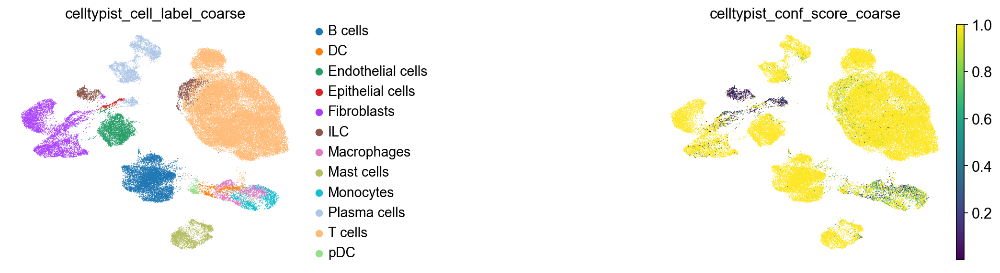

In [47]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

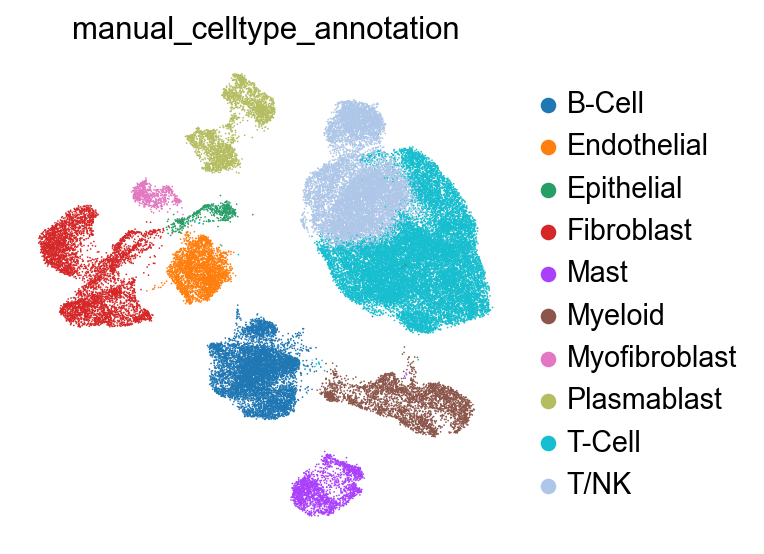

In [48]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

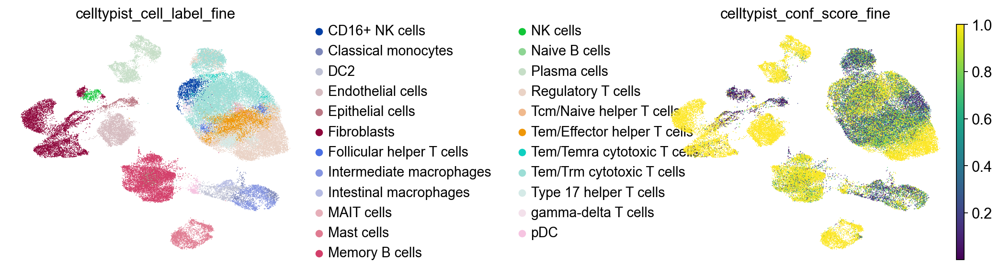

In [49]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

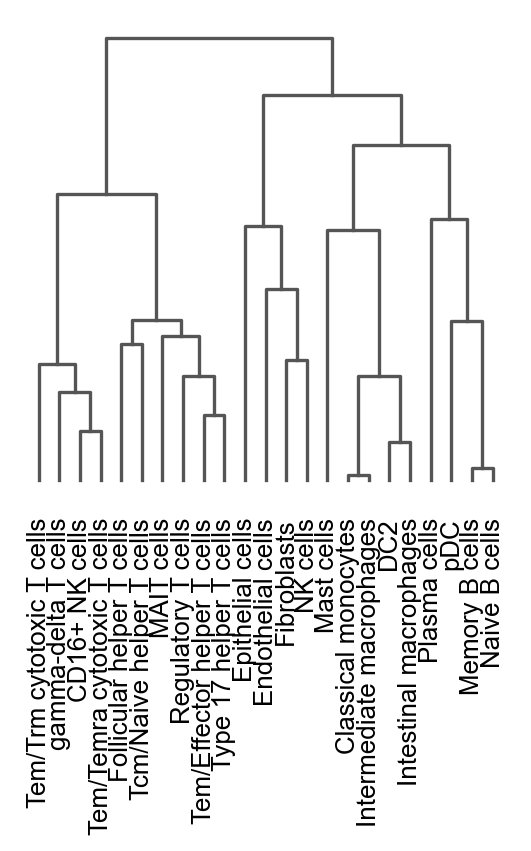

<Axes: >

In [50]:
#shows the celltypist predictions, check for expected cell types

sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")



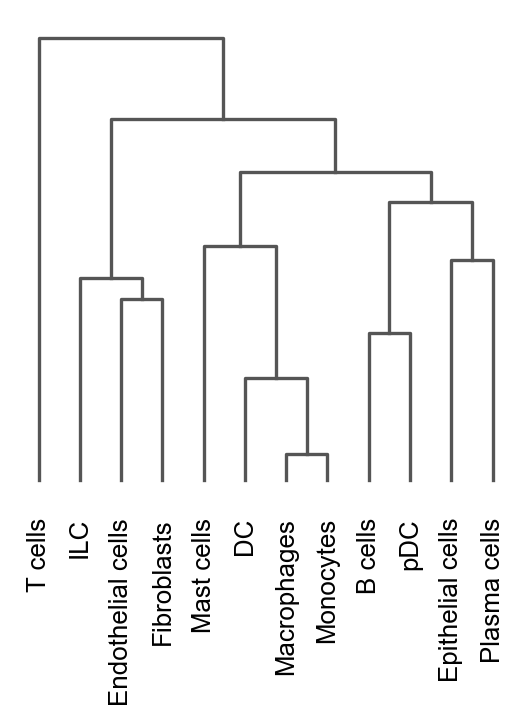

<Axes: >

In [51]:
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_coarse")

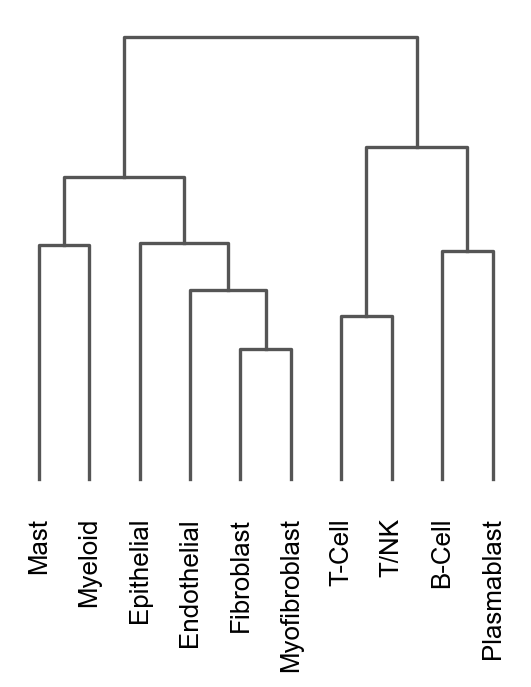

<Axes: >

In [68]:
sc.pl.dendrogram(adata, groupby="manual_celltype_annotation")

In [52]:
pd.crosstab(adata.obs.leiden_res0_4, adata.obs.celltypist_cell_label_coarse)

celltypist_cell_label_coarse,B cells,DC,Endothelial cells,Epithelial cells,Fibroblasts,ILC,Macrophages,Mast cells,Monocytes,Plasma cells,T cells,pDC
leiden_res0_4,,,,,,,,,,,,
0,9,0,3,0,0,839,0,0,0,1,6989,0
1,1,0,0,0,0,2,0,0,0,5,7124,0
2,6815,4,0,0,0,0,0,0,0,0,6,6
3,3,0,1,0,0,1,0,0,0,4,6558,0
4,0,0,0,0,0,0,0,0,0,3,5032,0
5,3,486,0,2,0,0,1073,1,1155,3,128,266
6,0,0,10,0,2988,0,0,1,0,0,0,0
7,0,0,2857,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,2606,0


In [53]:
pd.crosstab(adata.obs.leiden_res0_4, adata.obs.celltypist_cell_label_fine)

celltypist_cell_label_fine,CD16+ NK cells,Classical monocytes,DC2,Endothelial cells,Epithelial cells,Fibroblasts,Follicular helper T cells,Intermediate macrophages,Intestinal macrophages,MAIT cells,...,Naive B cells,Plasma cells,Regulatory T cells,Tcm/Naive helper T cells,Tem/Effector helper T cells,Tem/Temra cytotoxic T cells,Tem/Trm cytotoxic T cells,Type 17 helper T cells,gamma-delta T cells,pDC
leiden_res0_4,,,,,,,,,,,,,,,,,,,,,
0,1039,5,0,3,0,0,0,0,0,37,...,0,1,95,0,74,132,6138,41,267,0
1,2,3,0,0,0,0,281,0,0,367,...,0,5,1219,280,1706,205,2610,452,1,0
2,0,0,4,0,0,0,0,0,0,0,...,237,0,1,0,0,0,5,0,0,6
3,1,0,0,1,1,0,292,0,0,11,...,0,3,1947,1,2156,0,688,1331,132,0
4,0,2,0,0,0,0,0,0,0,2,...,0,3,4476,0,91,0,12,446,3,0
5,0,561,682,0,2,0,0,1352,247,0,...,0,3,0,0,0,0,0,0,0,266
6,0,0,0,10,0,2988,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,2857,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,651,0,0,0,1955,0,0,0


In [55]:
adata.write("post_annotation.h5ad")

In [ ]:
#### Relevant to InferCNV -> needs my cell labels
# need to label cells as cancerous 
adata.obs['manual_celltype_annotation']

0            T-Cell
1            T-Cell
2            T-Cell
3            B-Cell
4            T-Cell
            ...    
52382        T-Cell
52383    Fibroblast
52384          T/NK
52385        T-Cell
52386    Fibroblast
Name: manual_celltype_annotation, Length: 52387, dtype: category
Categories (10, object): ['B-Cell', 'Endothelial', 'Epithelial', 'Fibroblast', ..., 'Myofibroblast', 'Plasmablast', 'T-Cell', 'T/NK']

# SCEVAN counts matrix for epithelial data

In [7]:
adata = sc.read_h5ad('post_annotation.h5ad')

In [8]:
adata.X = adata.layers['counts']

In [9]:
epithelial_adata = adata[adata.obs["manual_celltype_annotation"] == "Epithelial"]
epithelial_adata

View of AnnData object with n_obs × n_vars = 489 × 25815
    obs: 'cell_ids', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors', 'leiden_res0_25', 'leiden_res0_4', 'leiden_res0_5', 'leiden_res0_6', 'leiden_res0_7', 'leiden_res1', 'manual_celltype_annotation', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_cell_label_coarse_colors', 'celltypist_cell_label

In [13]:
#Extract raw counts from adata.X or adata.layers["raw"]
raw_counts = pd.DataFrame(epithelial_adata.X.toarray().T, index=epithelial_adata.var.index, columns=epithelial_adata.obs.cell_ids)
raw_counts.to_csv("epi_raw_counts_matrix.csv", sep=",", index=True, header=True)


In [18]:
raw_counts

cell_ids,AAACGCTTCATCTACT.1_1,AACCATGTCGAATGCT.1_1,ACATCCCAGTGCAAAT.1_1,ACCGTTCTCCTATGGA.1_1,ATCGCCTTCCATACAG.1_1,ATTTCACGTCCTACGG.1_1,CATAAGCGTACGCTAT.1_1,CATGAGTTCTCAGTCC.1_1,CCACACTGTGGCTTAT.1_1,CTAGACACACAGCTTA.1_1,...,TTCCTTCTCGATTGAC.1_9,TTGCCTGTCGGAAACG.1_9,TTGCTGCGTGAGTGAC.1_9,AAAGAACGTTGCGTAT.1_10,ACAGCCGGTCTGTCAA.1_10,AGCCAATAGACATAGT.1_10,ATTACCTTCGATCCCT.1_10,CCCTTAGAGCTTCATG.1_10,GACCAATGTATGGGAC.1_10,GTTCGCTTCGGAGTGA.1_10
gene_symbols,,,,,,,,,,,,,,,,,,,,,
AL627309.1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
AL669831.5,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
LINC00115,0.0,0.0,0.0,0.0,0.0,2.990277,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
FAM41C,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.971513,0.0,0.0,0.0
AL645608.1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AP000322.2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
LINC00322,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
LINC00319,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0


In [14]:
#extracting vector of cell IDs of non-tumours cells
non_tum_adata = adata[adata.obs["manual_celltype_annotation"] != "Epithelial"]
non_tum_cells = list(non_tum_adata.obs['cell_ids'])


In [15]:
np.savetxt("normCell_ids.csv", 
           non_tum_cells,
           delimiter =", ",  
           fmt ='% s')


In [17]:
#Extracting full raw count matrix

raw_counts = pd.DataFrame(adata.X.toarray().T, index=adata.var.index, columns=adata.obs.index)


In [ ]:
raw_counts.to_csv("full_raw_count.csv", sep=",", index=True, header=True)

: 

# Subsetting based on high-level annotation

as in ref paper:
Lymphocyte T/NK (clusters T and NK)
Lymphocyte B (B and Plasmablast)
Stromal (Epithelial, Endothelial, Fibroblast, Myofibroblast)
Myeloid
Mast
Cycling

In [3]:
adata = sc.read_h5ad("post_annotation.h5ad")

In [14]:
### Taking raw counts only -> analysis will have to be redone for each high level cluster

#Separate for use with inferCNV/SCEVAN 
epithelial_adata = adata[adata.obs["manual_celltype_annotation"] == "Epithelial"]

#As in paper for reclustering
mast_adata = adata[adata.obs["manual_celltype_annotation"] == "Mast"]

myeloid_adata = adata[adata.obs["manual_celltype_annotation"] == "Myeloid"]

lymphT_adata = adata[adata.obs["manual_celltype_annotation"].isin(["T-Cell", "NK", "T/NK"])]

lymphB_adata = adata[adata.obs["manual_celltype_annotation"].isin(["B-Cell", "Plasmablast"])]

stromal_adata = adata[adata.obs["manual_celltype_annotation"].isin(["Epithelial", "Endothelial", "Fibroblast", "Myofibroblast"])]


In [15]:
#removes all metadata except gene symbols and cell ids from an adata object
def exportCountsAdata(fullAdata):
    toExport = anndata.AnnData(X=fullAdata.X, var = fullAdata.var[['gene_symbols']], obs = fullAdata.obs[['cell_ids']])

    return toExport

In [17]:
exportCountsAdata(epithelial_adata).write("epi_adata.h5ad")
exportCountsAdata(mast_adata).write("mast_adata.h5ad")
exportCountsAdata(myeloid_adata).write("myeloid_adata.h5ad")
exportCountsAdata(lymphT_adata).write("lymphT_adata.h5ad")
exportCountsAdata(lymphB_adata).write("lymphB_adata.h5ad")
exportCountsAdata(stromal_adata).write("stromal_adata.h5ad")